# Recommendation System for Amazon's Books

## negative review

In [ ]:
review = neg_bertviz['reviewText'].iloc[0]

# Tokenize and encode the input review
inputs = tokenizer.encode_plus(
    review,
    return_tensors='pt',
    add_special_tokens=True,
    max_length=52,
    truncation=True,
    padding='max_length'
)
input_ids = inputs['input_ids']
attention_mask = inputs['attention_mask']


In [ ]:
outputs = model(input_ids, attention_mask=attention_mask, output_attentions=True)

attention = outputs.attentions  # Get attention scores
tokens = tokenizer.convert_ids_to_tokens(input_ids[0])


In [ ]:
head_view(attention, tokens)

<IPython.core.display.Javascript object>

Unfortunately this was not a successful case of Bertviz. By looking at the different layers, we saw that the model "learned" mostly none words, or not important ones. This can be the result of using a different model than the one made for sentiment, or an unlucky randomized choice of text.

### Logistic regression

We have a model for extracting sentiment using Hugging Face, and a straightforward comparison would be to use logistic regression for predicting sentiments.


To conduct this comparison, we use the already created BOW DataFrame to perform a three-level logistic regression. The model is trained on 80% of the dataset, and we then compare the results of the remaining 20% from the logistic regression with the sentiment analysis conducted by the Hugging Face model. The comparison will focus solely on the positive and negative sentiments, excluding those that are slightly negative or slightly positive.

In [ ]:
df_for_logistic=pd.read_csv('/content/drive/MyDrive/bow_df.csv')

In [ ]:
df_to_merge_logistic=pd.read_csv("/content/drive/MyDrive/df_for_recommendations_systems_50_to_100_reviews.csv")

In [ ]:
merged_logistics=pd.concat([df_to_merge_logistic.reset_index(drop=True), df_for_logistic.reset_index(drop=True)], axis=1)


In [ ]:
merged_logistics.drop(['Unnamed: 0'],axis=1,inplace=True)

We import sklearn logistic regression model and create classification and accuracy reports.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

X = merged_logistics.iloc[:, 8:58]  # Features (columns 8 to 57 inclusive)
y = merged_logistics['overall'].apply(lambda x: 'negative' if x < 3 else ('neutral' if x == 3 else 'positive'))  # Target labels

# Calculate the split index 80% of first rows
split_index = int(0.8 * len(merged_logistics))

X_train, X_test = X.iloc[:split_index], X.iloc[split_index:]
y_train, y_test = y.iloc[:split_index], y.iloc[split_index:]

model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# Create the 'sentiment' column
merged_logistics['sentiment'] = ''
merged_logistics.loc[:split_index, 'sentiment'] = y_train  # Training set sentiment
merged_logistics.loc[split_index:, 'sentiment'] = y_pred  # Test set sentiment

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.779328253859544

Classification Report:
               precision    recall  f1-score   support

    negative       0.40      0.04      0.07      2345
     neutral       0.39      0.04      0.07      5375
    positive       0.79      0.99      0.88     27323

    accuracy                           0.78     35043
   macro avg       0.53      0.36      0.34     35043
weighted avg       0.70      0.78      0.70     35043



The results shown are not particularly strong, which is expected. This outcome likely stems from the fact that review text does not always accurately reflect the actual rating, as we will explore further. When using logistic regression, we had to compel the model to learn from the available observations because the rating was our sole indicator of the true sentiment behind these reviews.


In [ ]:
merged_logistics.drop(['sentiment'],axis=1,inplace=True)

In [ ]:
merged_logistics.to_csv("/content/drive/MyDrive/dataset_with_logistic_of_sentiment.csv")

## Comparing the sentiment and logistics:
We wanted to check whether the sentiment is more complex and nuanced then simple logistic regression. It seems on the surface it might be, so we would compare and see how much they differ from each other. One should notice, that as we are not going to manually provide the actual sentiment, we cannot really know the correct classifications of either (this also assumes there is a correct classification of sentiment for each review text).

In [ ]:
logistics_to_compare_df=pd.read_csv("/content/drive/MyDrive/dataset_with_logistic_of_sentiment.csv").dropna(subset=['predicted_sentiment'])

In [ ]:
logistics_to_compare_df.head(2)

,Unnamed: 0,overall,verified,reviewerID,asin,style,reviewText,summary,__index_level_0__,author,...,want,war,way,work,world,writing,written,years,true_sentiment,predicted_sentiment
140171,140171,4,False,A7GDKNGJOY4D8,0007444117,{'Format:': ' Kindle Edition'},***I received this book as a gift\n\nPROS:\nAg...,"Agony. Utter and total desperate, heart-wrench...",218353,0,...,1,1,0,0,0,1,0,0,positive,positive
140172,140172,3,True,APGJC13RI61U0,0007444117,{'Format:': ' Kindle Edition'},"After reading the first two, this one seemed t...",Fell Short,218432,0,...,0,0,0,0,0,0,0,0,neutral,positive


In [ ]:
logistics_to_compare_df_only_relevant_columns=logistics_to_compare_df[['__index_level_0__','predicted_sentiment']]

In [ ]:
logistics_to_compare_df_only_relevant_columns = logistics_to_compare_df_only_relevant_columns.rename(columns={'predicted_sentiment': 'sentiment_category'})

Reading the sentiment df.

In [ ]:
sentiment_df_for_compare=pd.read_csv("/content/drive/MyDrive/sentiment_without_category_for_nn.csv")

In [ ]:
sentiment_df_for_compare_filtered=sentiment_df_for_compare[sentiment_df_for_compare['__index_level_0__'].isin(logistics_to_compare_df['__index_level_0__'])]


In [ ]:
# Define the mapping
sentiment_mapping = {
    0: 'negative',
    1: 'neutral',
    2: 'neutral',
    3: 'positive'
}

# Apply the mapping
sentiment_df_for_compare_filtered['sentiment_category'] = sentiment_df_for_compare_filtered['sentiment_category'].map(sentiment_mapping)

In [ ]:
# Merge the DataFrames on '__index_level_0__'
merged_df = logistics_to_compare_df_only_relevant_columns.merge(sentiment_df_for_compare_filtered, on='__index_level_0__', suffixes=('_df1', '_df2'))

merged_df['sentiment_match'] = merged_df.apply(lambda row: f"{row['sentiment_category_df1']} {row['sentiment_category_df2']}", axis=1)

sentiment_counts = merged_df['sentiment_match'].value_counts().reset_index()
sentiment_counts.columns = ['sentiment_combination', 'count']

# Calculate the total number of matches/mismatches
total_count = sentiment_counts['count'].sum()

# Calculate the percentage for each combination
sentiment_counts['percentage'] = round((sentiment_counts['count'] / total_count) * 100,1)

print(sentiment_counts)

  sentiment_combination  count  percentage
0     positive positive  26187        71.9
1     positive negative   6451        17.7
2      positive neutral   3013         8.3
3      neutral positive    242         0.7
4      neutral negative    219         0.6
5     negative negative    140         0.4
6       neutral neutral     87         0.2
7     negative positive     63         0.2
8      negative neutral     29         0.1


The left part of the combination is the logistic regression and the left is the sentiment extraction.
As we see from the results, the positive and positive were a huge chunk of the data. It is of no surprise, as most reviews were originally positive. However the logistics chose a lot of places to give positive while the sentiment gave negative and neutral, together it sums up to 26% out of the total data set, showing discrepancies between the two methods.

# ***Recommmendation Systems***

In here we set on to the adventure of trying to create recommendation systems. We have decided to try and create 5 different recommendation systems, and then compare their performances. Each one will be explained in detail.

In [ ]:
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import ndcg_score
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


We start with the most simple model first

# 1. Matrix Factorization Model

Matrix Factorization model is the one of the basic and foundation stones for recommendation systems. Thus we have started with this simple model.It isn't computational too heavy, and it is well established in the literature.

In [ ]:
!pip install surprise

In [ ]:
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split
from surprise import accuracy

In [ ]:
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(df_filtered[['reviewerID', 'asin', 'overall']], reader)

From here on we would use test set of 25% out of the total data we had decided to use.

In [ ]:
trainset, testset = train_test_split(data, test_size=0.25, random_state=42)

In [ ]:
algo = SVD()
algo.fit(trainset)

In [ ]:
mf_predictions = algo.test(testset)

### Saving performance

At the beginning, we started with evaluating the RMSE. However, after a while, we decided to add NDCG and MAP since they prioritize the ranking of recommendations over the absolute accuracy of predicted ratings, which is crucial in scenarios like movie or product suggestions where a precise rating (such as 4.2 vs. 4.5) is less critical than ensuring the most appreciated items top the list. NDCG emphasizes the relevance of items at the start of the recommendation list, where user engagement is highest, enhancing user satisfaction as users typically interact more with these initial recommendations. Similarly, MAP focuses on how well the most relevant items are ranked across all users, rewarding the model for placing relevant items early in the list. This approach aligns closely with business objectives, such as increasing user engagement, satisfaction, and retention, by ensuring that both the quality of the rankings and the most impactful parts of the list are prioritized.

We created an easy to use function for our needs to calculate map

In [ ]:
from sklearn.metrics import label_ranking_average_precision_score

def calculate_map(true_ratings, pred_ratings):
    true_ratings = np.array(true_ratings)
    pred_ratings = np.array(pred_ratings)

    # Create a sorted index based on true ratings, high to low
    ideal_rank = np.argsort(-true_ratings)

    predicted_rank = np.argsort(-pred_ratings)

    # Generate ideal and predicted rank lists
    ideal_rank_list = [np.where(ideal_rank == i)[0][0] for i in range(len(true_ratings))]
    predicted_rank_list = [np.where(predicted_rank == i)[0][0] for i in range(len(true_ratings))]

    # Convert ranks to binary relevance: top X% as relevant
    cutoff_percent = 20
    cutoff = len(true_ratings) * cutoff_percent // 100
    ideal_relevance = [1 if x < cutoff else 0 for x in ideal_rank_list]
    predicted_relevance = [1 if x < cutoff else 0 for x in predicted_rank_list]

    return label_ranking_average_precision_score([ideal_relevance], [predicted_relevance])

In [ ]:
from sklearn.metrics import ndcg_score, mean_squared_error

test_predictions = algo.test(testset)
true_ratings = [pred.r_ui for pred in test_predictions]
pred_ratings = [pred.est for pred in test_predictions]

ndcg = ndcg_score([true_ratings], [pred_ratings])
rmse = mean_squared_error(true_ratings, pred_ratings, squared=False)
map_score = calculate_map(true_ratings, pred_ratings)

print(f"Metrics:\nNDCG: {ndcg:.4f}\nRMSE: {rmse:.4f}\nMAP: {map_score:.4f}")


Metrics:
NDCG: 0.9926
RMSE: 0.8903
MAP: 0.2494


The results of the matrix factorization model would serve as base comparison. For now it is hard to decide whether those results were good or not.

We decided to store that metrics for later use, so we would be able to compare the models without retraining them. So we created such function

In [ ]:
def save_performance_data(model_name, rmse, ndcg, map_score):
    performance_data = {
        'model_name': model_name,
        'rmse': rmse,
        'ndcg': ndcg,
        'map': map_score
    }
    file_path = '/content/drive/MyDrive/models/model_performance.json'

    try:
        with open(file_path, 'r') as f:
            data = json.load(f)
    except FileNotFoundError:
        data = []

    data.append(performance_data)

    # Write back to JSON
    with open(file_path, 'w') as f:
        json.dump(data, f, indent=4)

In [ ]:
save_performance_data('matrix_factorization_model', rmse, ndcg, map_score)

# 2. Collaborative Filtering
Collaborative Filtering is a popular technique used in recommendation systems to predict a user's preferences for items based on the preferences of other users. The fundamental idea is that if two users have agreed on items in the past, they are likely to agree on similar items in the future.

There are two main types of collaborative filtering: User-based Collaborative Filtering and Item-based Collaborative Filtering. User-based focuses on finding similarities between users, while item based focuses on finding similarities between items. In this project we will show item-based models, due to lack of resources. Item-based models generally handle sparsity better than user-based models. In large datasets, especially those with many users and items most users interact with only a small subset of items, leading to a sparse user-item interaction matrix. In addition, Items (like books) usually have more interactions (ratings) than individual users, making it easier to identify patterns in item similarities, even with limited data for some users.

We need to provide the model with the different latent factors.

In [ ]:
n_factors = 5
n_users = df_filtered['reviewerID'].nunique()
n_books = df_filtered['asin'].nunique()

In [ ]:
train_df, test_df = train_test_split(df_filtered, test_size=0.25, random_state=42)

# Create dictionaries to map user and book IDs to integers
user_to_idx = {user_id: i for i, user_id in enumerate(df_filtered['reviewerID'].unique())}
book_to_idx = {asin: i for i, asin in enumerate(df_filtered['asin'].unique())}

# Convert user and book IDs to integers in the DataFrame
train_df['user_idx'] = train_df['reviewerID'].map(user_to_idx)
train_df['book_idx'] = train_df['asin'].map(book_to_idx)
test_df['user_idx'] = test_df['reviewerID'].map(user_to_idx)
test_df['book_idx'] = test_df['asin'].map(book_to_idx)



The architecture includes the following components:

User and Book Embeddings:

Embeddings: We use embedding layers to represent users and books as dense vectors in a lower-dimensional space. This approach is chosen to capture the latent factors that influence user preferences and item characteristics.

User and Book Biases:

Bias Terms: To account for inherent biases in the data, we include bias terms for both users and books. These terms capture tendencies such as a user generally giving higher ratings or a book generally receiving higher ratings.

Forward Pass and Interaction Prediction:

Process: The forward method takes in user and book indices, retrieves the corresponding embeddings, and calculates the dot product between the user and book embeddings. This product represents the interaction between the user and the book, to which the user and book biases are added.
Final Prediction: The result is passed through a sigmoid activation function to map it to a value between 0 and 1, which is then scaled to the desired rating range (e.g., between 0 and 5.5, with later fixing those with prediction of 0 to 1 as it is the lowest score). We read from fastai documentation that it was found that networks with range 0-5.5 generally preform better then network with the exact range 1-5. This final output represents the predicted rating for the user-book pair.



In [ ]:
class CollaborativeFilteringModel(nn.Module):
    def __init__(self, n_users, n_books, n_factors=5, y_range=(0, 5.5)):
        super(CollaborativeFilteringModel, self).__init__()
        self.user_factors = nn.Embedding(n_users, n_factors)
        self.user_bias = nn.Embedding(n_users, 1)
        self.book_factors = nn.Embedding(n_books, n_factors)
        self.book_bias = nn.Embedding(n_books, 1)
        self.y_range = y_range

    def forward(self, user_idx, book_idx):
        user_embed = self.user_factors(user_idx)
        book_embed = self.book_factors(book_idx)
        user_bias = self.user_bias(user_idx)
        book_bias = self.book_bias(book_idx)
        res = (user_embed * book_embed).sum(dim=1, keepdim=True)
        res += user_bias + book_bias
        predicted_rating = torch.sigmoid(res)
        return predicted_rating * (self.y_range[1] - self.y_range[0]) + self.y_range[0]


This model is straightforward yet powerful, capturing both the interactions between users and books and the inherent biases in the data. It ideally provides a strong foundation for accurate predictions with a relatively simple structure.


In [ ]:
model = CollaborativeFilteringModel(n_users,n_books, n_factors).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

In [ ]:
user_idx_tensor = torch.LongTensor(train_df['user_idx'].values).to(device)
book_idx_tensor = torch.LongTensor(train_df['book_idx'].values).to(device)
ratings_tensor = torch.FloatTensor(train_df['overall'].values).to(device)

train_dataset = TensorDataset(user_idx_tensor, book_idx_tensor, ratings_tensor)
train_loader = DataLoader(train_dataset, batch_size=1024, shuffle=True)

Because later on we want to conduct an error analysis, in here we need to capture the test data set different characteristics and thus creating a customized function. As we also wanted to tailor each network to our needs, we needed to use a lot of code that is somewhat similar but with small changes. This leads to a lot of code that is written for the next systems because we could not use ready made neural networks(unfortunately) and creating a function for our needs is not useful.
We needed to restart sessions between the running of our networks, beacause each one builds on the previous one architecture. This is another reason why we needed to add the code from the CF network each time.

In [ ]:
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, user_idx, book_idx, ratings, asins, reviewer_ids):
        self.user_idx = user_idx
        self.book_idx = book_idx
        self.ratings = ratings
        self.asins = asins
        self.reviewer_ids = reviewer_ids

    def __len__(self):
        return len(self.user_idx)

    def __getitem__(self, idx):
        return (self.user_idx[idx],
                self.book_idx[idx],
                self.ratings[idx],
                self.asins[idx],  # Return asins as strings
                self.reviewer_ids[idx])  # Return reviewer IDs as strings


In [ ]:
user_idx_tensor_test = torch.LongTensor(test_df['user_idx'].values).to(device)
book_idx_tensor_test = torch.LongTensor(test_df['book_idx'].values).to(device)
ratings_tensor_test = torch.FloatTensor(test_df['overall'].values).to(device)

test_dataset = CustomDataset(
    user_idx_tensor_test,
    book_idx_tensor_test,
    ratings_tensor_test,
    test_df['asin'].values,
    test_df['reviewerID'].values
)

test_loader = DataLoader(test_dataset, batch_size=1024, shuffle=False)


The number of epochs we decided to train each NN was 30, as it seems appropriate to the amount of data we have. We chose the classic Adam optimizer as it is still one of the best that exist, and using loss function of MSE.

In [ ]:
num_epochs = 30
train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []

for epoch in range(num_epochs):
    # Training Phase
    model.train()
    total_train_loss = 0
    correct_train_preds = 0
    total_train_preds = 0

    for user_idx, book_idx, true_ratings in train_loader:
        optimizer.zero_grad()
        pred_ratings = model(user_idx, book_idx).squeeze()

        loss = criterion(pred_ratings, true_ratings)
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

        # Calculate accuracy for train
        predicted_ratings = torch.round(pred_ratings).long()  # Round predictions to the nearest whole number
        predicted_ratings = torch.clamp(predicted_ratings, min=1)

        correct_train_preds += torch.sum(predicted_ratings == true_ratings).item()
        total_train_preds += len(true_ratings)

    avg_train_loss = total_train_loss / len(train_loader)
    avg_train_accuracy = correct_train_preds / total_train_preds
    train_losses.append(avg_train_loss)
    train_accuracies.append(avg_train_accuracy)

    # Testing Phase
    model.eval()
    total_test_loss = 0
    correct_test_preds = 0
    total_test_preds = 0

    with torch.no_grad():
        cf_predicted_ratings = pd.DataFrame()

        for user_idx, book_idx, true_ratings, asin, reviewerID in test_loader:
            pred_ratings = model(user_idx, book_idx).squeeze()
            loss = criterion(pred_ratings, true_ratings)
            total_test_loss += loss.item()
            # Calculate accuracy for test
            predicted_ratings = torch.round(pred_ratings).long()  # Round predictions to the nearest whole number
            predicted_ratings = torch.clamp(predicted_ratings, min=1)
            batch_df = pd.DataFrame({
            'asin': np.array(asin),  # No need to use .cpu() since asin is already a numpy array of strings
            'reviewerID': np.array(reviewerID),  # Same for reviewerID
            'true_ratings': true_ratings.cpu().numpy(),
            'pred_ratings': predicted_ratings.cpu().detach().numpy()
        })
            cf_predicted_ratings = pd.concat([cf_predicted_ratings, batch_df], ignore_index=True)
            correct_test_preds += torch.sum(predicted_ratings == true_ratings).item()
            total_test_preds += len(true_ratings)

    avg_test_loss = total_test_loss / len(test_loader)
    avg_test_accuracy = correct_test_preds / total_test_preds
    test_losses.append(avg_test_loss)
    test_accuracies.append(avg_test_accuracy)


In [ ]:
cf_predicted_ratings.to_csv("/content/drive/MyDrive/cf_predicted_ratings.csv")

We are storing the models with pickle using built-in pytorch saving syntax, after the training process

In [ ]:
torch.save(model.state_dict(), '/content/drive/MyDrive/models/cf.pth')

In [ ]:
user_idx_tensor_test = torch.LongTensor(test_df['user_idx'].values).to(device)
book_idx_tensor_test = torch.LongTensor(test_df['book_idx'].values).to(device)
model.eval()
pred_ratings_test = model(user_idx_tensor_test, book_idx_tensor_test).detach().cpu().numpy()
true_ratings = test_df['overall'].values
true_ratings, pred_ratings_test =  true_ratings.reshape(-1), pred_ratings_test.reshape(-1)

ndcg = ndcg_score([true_ratings], [pred_ratings_test])

rmse = np.sqrt(mean_squared_error(true_ratings, pred_ratings_test, squared=False))

map_score = calculate_map(true_ratings, pred_ratings_test)

print(f"Metrics:\nNDCG: {ndcg:.4f}\nRMSE: {rmse:.4f}\nMAP: {map_score:.4f}")
save_performance_data('cf_with_bias_and_regularization_model', rmse, ndcg, map_score)


Metrics:
NDCG: 0.9866
RMSE: 1.1851
MAP: 0.2171


We will now create a function that will be useful to plot the train and test loss and accuracy, in order to understand the performance of our networks.

In [ ]:
def plot_train_and_test_loss_accuracy():
    epochs = range(1, num_epochs + 1)

    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.plot(epochs, test_losses, label='Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Train Accuracy')
    plt.plot(epochs, test_accuracies, label='Test Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.show()

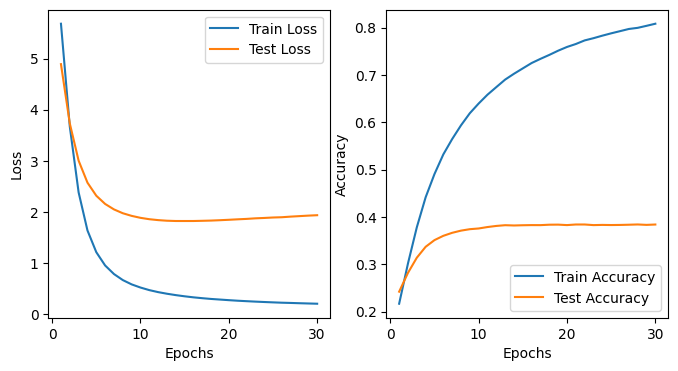

In [ ]:
plot_train_and_test_loss_accuracy()

In here we see the results are not as good as the matrix factorization model. One can also see that the train continutes to improve, while the test doesn't.
This might show overfitting, as we see the test accuracy reaches to plataeu, and it wouldn't make the accuracy better if we run the model for more iterations.

**Adding regularization**

In order to prevent overfitting, we would now try to modify the model that uses regularization. We have run all the previous code for this model, this time with only adding L2 regularization:

In [ ]:
model = CollaborativeFilteringModel(n_users,n_books, n_factors).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=0.01)

However, even when trying many parameters for the regularization parameter, our results showed that the network now reached to a local minimum, that made the prediction worse:

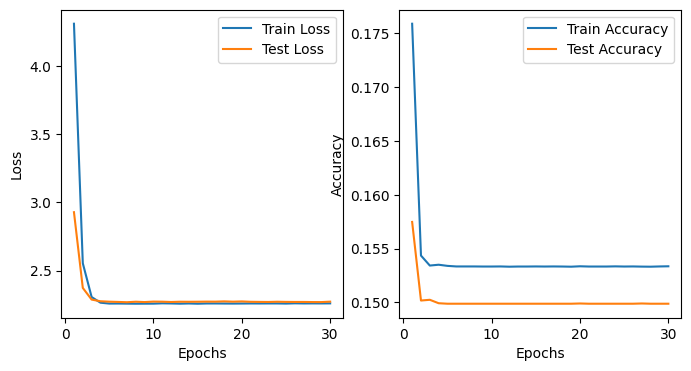

Another example that we tried was chagning the parameter to 0.05:

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=0.05)

As we saw earlier, we still get to a local minimum which makes our network's performance worse.

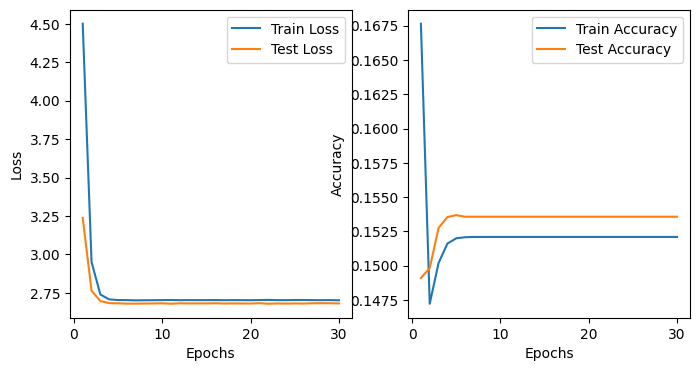

Now we would like to see if we can get recommendation based on our models so far for different users (future work will include to change the recommended books numbers to actually boooks):

In [ ]:
all_users = train_df['user_idx'].unique()
all_books = train_df['book_idx'].unique()

recommendations = []

model.to(device)

# Collect recommendations
with torch.no_grad():
    for user in all_users:
        user_idx_tensor = torch.LongTensor([user] * len(all_books)).to(device)
        book_idx_tensor = torch.LongTensor(all_books).to(device)
        pred_ratings = model(user_idx_tensor, book_idx_tensor).squeeze()
        top_books_idx = torch.argsort(pred_ratings, descending=True)[:10].cpu()
        top_books = all_books[top_books_idx]
        recommendations.extend(top_books.tolist())  # Collect all recommended books

# Count occurrences of each book
book_counts = pd.Series(recommendations).value_counts()

# Get top recommended books and their counts
top_books = book_counts.head(10)
top_books_idx = top_books.index.tolist()

# Print top recommended books with counts
print("Top Recommended Books:")
for book_idx in top_books_idx:
    print(f"Book ID: {book_idx}, Count: {top_books[book_idx]}")

Top Recommended Books:
Book ID: 32709, Count: 2278
Book ID: 3899, Count: 2165
Book ID: 10108, Count: 1950
Book ID: 26654, Count: 1944
Book ID: 17619, Count: 1856
Book ID: 30796, Count: 1618
Book ID: 11017, Count: 1596
Book ID: 31574, Count: 1542
Book ID: 30232, Count: 1323
Book ID: 25999, Count: 1301


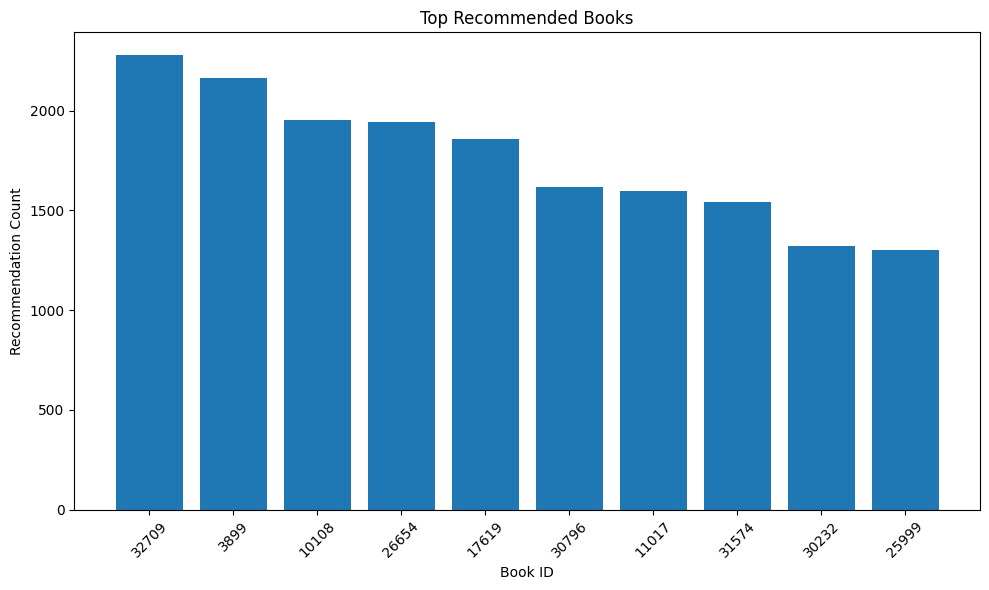

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(top_books.index.astype(str), top_books.values)
plt.xlabel('Book ID')
plt.ylabel('Recommendation Count')
plt.title('Top Recommended Books')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

One can see that some books are more recommended than others but the difference between each decreasing pair of the top 10 is not that big.

# 3. Collaborative filtering with category

This model is built on the previous one, while also adding the category feature.

In [ ]:
asin_file=f"/content/drive/MyDrive/asin_to_category.parquet"
asin_to_category = pd.read_parquet(asin_file)

In [ ]:
result_df = df_filtered.merge(asin_to_category, on='asin', how='left')

We map the category for the NN.

In [ ]:
category_to_idx = {}
categories = result_df['extracted_category'].unique()
categories_series = pd.Series(categories)

for i, category in enumerate(categories):
        category_to_idx[category] = i

In [ ]:
train_df['category_idx'] = train_df['extracted_category'].map(category_to_idx)
test_df['category_idx'] = test_df['extracted_category'].map(category_to_idx)

In [ ]:
from torch.utils.data import TensorDataset, DataLoader

# Create TensorDatasets and DataLoaders
train_dataset = TensorDataset(
    torch.LongTensor(train_df['user_idx'].values),
    torch.LongTensor(train_df['book_idx'].values),
    torch.LongTensor(train_df['category_idx'].values),
    torch.FloatTensor(train_df['overall'].values)
)
train_loader = DataLoader(train_dataset, batch_size=1024, shuffle=True)



In [ ]:
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, user_idx, book_idx, category_idx, ratings, asins, reviewer_ids):
        self.user_idx = user_idx
        self.book_idx = book_idx
        self.category_idx = category_idx  # Add category indices
        self.ratings = ratings
        self.asins = asins
        self.reviewer_ids = reviewer_ids

    def __len__(self):
        return len(self.user_idx)

    def __getitem__(self, idx):
        return (self.user_idx[idx],
                self.book_idx[idx],
                self.category_idx[idx],  # Return category index
                self.ratings[idx],
                self.asins[idx],  # Return asins as strings
                self.reviewer_ids[idx])  # Return reviewer IDs as strings

In [ ]:
category_idx_tensor_test = torch.LongTensor(test_df['category_idx'].values).to(device)

test_dataset = CustomDataset(
    user_idx_tensor_test,
    book_idx_tensor_test,
    category_idx_tensor_test,
    ratings_tensor_test,
    test_df['asin'].values,  # Pass asins as strings
    test_df['reviewerID'].values  # Pass reviewer IDs as strings
)

# DataLoader remains the same
test_loader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

In [ ]:
class CategoryModel(nn.Module):
    def __init__(self, result_df, n_factors=5, y_range=(0, 5.5)):
        super(CategoryModel, self).__init__()
        n_users, n_books, n_categories = result_df['reviewerID'].nunique(), result_df['asin'].nunique(), result_df['extracted_category'].nunique()
        self.n_categories = n_categories
        self.user_factors = nn.Embedding(n_users, n_factors)
        self.user_bias = nn.Embedding(n_users, 1)
        self.book_factors = nn.Embedding(n_books, n_factors)
        self.book_bias = nn.Embedding(n_books, 1)
        self.category_factors = nn.Embedding(n_categories, n_factors)
        self.y_range = y_range

    def forward(self, user_idx, book_idx, category_idx):
        user_embed = self.user_factors(user_idx)
        book_embed = self.book_factors(book_idx)
        category_embed = self.category_factors(category_idx)
        user_bias = self.user_bias(user_idx)
        book_bias = self.book_bias(book_idx)
        res = (user_embed * book_embed * category_embed).sum(dim=1, keepdim=True)
        res += user_bias + book_bias
        predicted_rating = torch.sigmoid(res)
        return predicted_rating * (self.y_range[1] - self.y_range[0]) + self.y_range[0]


In [ ]:
import torch.optim as optim
import matplotlib.pyplot as plt
model = CategoryModel(result_df).to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

num_epochs = 30
train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []

for epoch in range(num_epochs):
    # Training Phase
    model.train()
    total_train_loss = 0
    correct_train_preds = 0
    total_train_preds = 0

    for user_idx_batch, book_idx_batch, ratings_batch, category_idx_batch in train_loader:
        user_idx_batch = user_idx_batch.long()
        book_idx_batch = book_idx_batch.long()
        category_idx_batch = category_idx_batch.long()
        ratings_batch = ratings_batch.float()
        optimizer.zero_grad()
        pred_ratings = model(user_idx_batch, book_idx_batch, category_idx_batch).squeeze()
        loss = criterion(pred_ratings, ratings_batch)
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()

        # Calculate accuracy for train
        predicted_ratings = torch.round(pred_ratings).long()  # Round predictions to the nearest whole number
        predicted_ratings = torch.clamp(predicted_ratings, min=1)

        correct_train_preds += torch.sum(predicted_ratings == ratings_batch).item()
        total_train_preds += len(ratings_batch)

    avg_train_loss = total_train_loss / len(train_loader)
    avg_train_accuracy = correct_train_preds / total_train_preds
    train_losses.append(avg_train_loss)
    train_accuracies.append(avg_train_accuracy)

    # Testing Phase
    model.eval()
    total_test_loss = 0
    correct_test_preds = 0
    total_test_preds = 0

    with torch.no_grad():
        cf_predicted_ratings = pd.DataFrame()

        for user_idx, book_idx, category_idx, true_ratings, asin, reviewerID in test_loader:
            user_idx = user_idx.long()
            book_idx = book_idx.long()
            category_idx = category_idx.long()

            pred_ratings = model(user_idx, book_idx, category_idx).squeeze()
            loss = criterion(pred_ratings, true_ratings)
            total_test_loss += loss.item()

            # Calculate accuracy for test
            predicted_ratings = torch.round(pred_ratings).long()  # Round predictions to the nearest whole number
            predicted_ratings = torch.clamp(predicted_ratings, min=1)

            batch_df = pd.DataFrame({
                'asin': np.array(asin),  # No need to use .cpu() since asin is already a numpy array of strings
                'reviewerID': np.array(reviewerID),  # Same for reviewerID
                'true_ratings': true_ratings.cpu().numpy(),
                'pred_ratings': predicted_ratings.cpu().detach().numpy(),
                'category_idx': category_idx.cpu().numpy()  # Add category index to the DataFrame
            })

            cf_predicted_ratings = pd.concat([cf_predicted_ratings, batch_df], ignore_index=True)
            correct_test_preds += torch.sum(predicted_ratings == true_ratings).item()
            total_test_preds += len(true_ratings)

    avg_test_loss = total_test_loss / len(test_loader)
    avg_test_accuracy = correct_test_preds / total_test_preds
    test_losses.append(avg_test_loss)
    test_accuracies.append(avg_test_accuracy)



# Save the model
torch.save(model.state_dict(), '/content/drive/MyDrive/models/cf_with_category.pth')


In [ ]:
cf_predicted_ratings.to_csv("/content/drive/MyDrive/cf_category_predicted_ratings.csv")

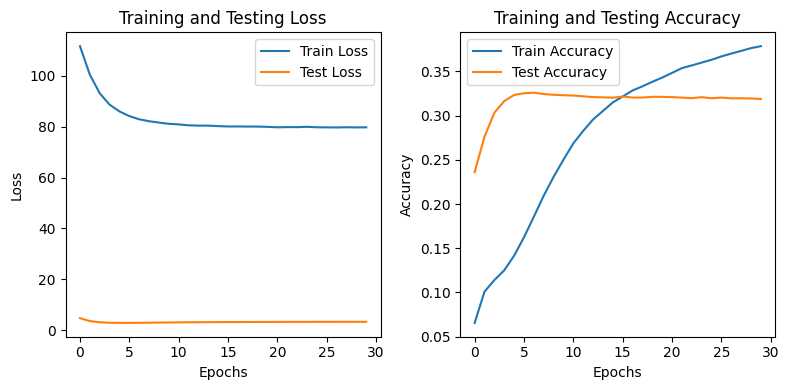

In [ ]:
plot_train_and_test_loss_accuracy()

This graphs shows that the model has poor generalization to unseen data, since we have very high loss in the train set, and very low accuracy in train set. This might indicate that the extracted category from the metadata file doesn't help us a lot. The loss of the train is extremely high.

In [ ]:
category_idx_tensor = torch.LongTensor(test_df['category_idx'].values).to(device)

model.eval()
with torch.no_grad():
    pred_ratings_test = model(user_idx_tensor_test, book_idx_tensor_test, category_idx_tensor).squeeze().cpu().numpy()
true_ratings = test_df['overall'].values
true_ratings, pred_ratings_test =  true_ratings.reshape(-1), pred_ratings_test.reshape(-1)

ndcg = ndcg_score([true_ratings], [pred_ratings_test])

rmse = np.sqrt(mean_squared_error(true_ratings, pred_ratings_test, squared=False))

map_score = calculate_map(true_ratings, pred_ratings_test)

print(f"Metrics:\nNDCG: {ndcg:.4f}\nRMSE: {rmse:.4f}\nMAP: {map_score:.4f}")

save_performance_data('cf_with_category', rmse, ndcg, map_score)



Metrics:
NDCG: 0.9828
RMSE: 1.3432
MAP: 0.2011


## 4. BOW Model

This model would utilize the BOW we have extracted earlier, in order to see if it improves the prediction.

In [ ]:
df_for_bow=pd.read_csv("/content/drive/MyDrive/bow_df.csv")

Preparing the df

In [ ]:
result_df=pd.concat([df_filtered,df_for_bow],axis=1)

In [ ]:
columns_to_drop = ['Unnamed: 0', '__index_level_0__','reviewText','summary','verified','style']

result_df.drop(columns_to_drop, axis=1, inplace=True)


In [ ]:
result_df.head(2)

,overall,reviewerID,asin,author,best,bit,book,books,character,characters,...,think,time,want,war,way,work,world,writing,written,years
0,5,A3H9YD6K9TVKDP,0001713353,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,5,A3QYDL5CDNYN66,0001061240,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,1


Creating the recommendation system for bow

In [ ]:
# Define the extended model
class ExtendedCollaborativeFilteringModel(nn.Module):
    def __init__(self, n_users, n_books, n_factors=5, n_bow_features=50, y_range=(0, 5.5)):
        super(ExtendedCollaborativeFilteringModel, self).__init__()
        self.user_factors = nn.Embedding(n_users, n_factors)
        self.user_bias = nn.Embedding(n_users, 1)
        self.book_factors = nn.Embedding(n_books, n_factors)

        self.book_bias = nn.Embedding(n_books, 1)
        self.bow_layer = nn.Linear(n_bow_features, 1)
        self.y_range = y_range

    def forward(self, user_idx, book_idx, bow_features):
        user_embed = self.user_factors(user_idx)
        book_embed = self.book_factors(book_idx)
        user_bias = self.user_bias(user_idx)
        book_bias = self.book_bias(book_idx)
        bow_output = self.bow_layer(bow_features)

        res = (user_embed * book_embed).sum(dim=1, keepdim=True)
        res += user_bias + book_bias + bow_output
        predicted_rating = torch.sigmoid(res)
        return predicted_rating * (self.y_range[1] - self.y_range[0]) + self.y_range[0]


In [ ]:
n_factors = 5
n_users = result_df['reviewerID'].nunique()
n_books = result_df['asin'].nunique()
n_bow_features = result_df.shape[1] - 3  # Subtracting 'overall', 'reviewerID', 'asin'

model = ExtendedCollaborativeFilteringModel(n_users, n_books, n_factors, n_bow_features).to(device)

# Prepare training data
ratings_tensor = torch.FloatTensor(train_df['overall'].values).to(device)

bow_features_tensor = torch.FloatTensor(train_df.drop(columns=['overall', 'reviewerID', 'asin', "user_idx", "book_idx"]).values).to(device)

train_dataset = TensorDataset(user_idx_tensor, book_idx_tensor, bow_features_tensor, ratings_tensor)
train_loader = DataLoader(train_dataset, batch_size=1024, shuffle=True)


In [ ]:
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, user_idx, book_idx, bow_features, ratings, asins, reviewer_ids):
        self.user_idx = user_idx
        self.book_idx = book_idx
        self.bow_features = bow_features  # Use BoW features instead of category indices
        self.ratings = ratings
        self.asins = asins
        self.reviewer_ids = reviewer_ids

    def __len__(self):
        return len(self.user_idx)

    def __getitem__(self, idx):
        return (self.user_idx[idx],
                self.book_idx[idx],
                self.bow_features[idx],  # Return BoW features
                self.ratings[idx],
                self.asins[idx],  # Return asins as strings
                self.reviewer_ids[idx])  # Return reviewer IDs as strings


In [ ]:
bow_features_tensor_test = torch.FloatTensor(test_df.drop(columns=['overall', 'reviewerID', 'asin', "user_idx", "book_idx"]).values).to(device)
ratings_tensor_test = torch.FloatTensor(test_df['overall'].values).to(device)

test_dataset = CustomDataset(
    user_idx_tensor_test,
    book_idx_tensor_test,
    bow_features_tensor_test,  # Use BoW features
    ratings_tensor_test,
    test_df['asin'].values,  # Pass asins as strings
    test_df['reviewerID'].values  # Pass reviewer IDs as strings
)

test_loader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

In [ ]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

num_epochs = 30
train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []

for epoch in range(num_epochs):
    # Training Phase
    model.train()
    total_train_loss = 0
    correct_train_preds = 0
    total_train_preds = 0

    for user_idx, book_idx, bow_features, ratings in train_loader:
        optimizer.zero_grad()
        pred_ratings = model(user_idx, book_idx, bow_features).squeeze()

        loss = criterion(pred_ratings, ratings)
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

        # Calculate accuracy for train
        predicted_ratings = torch.round(pred_ratings).long()  # Round predictions to the nearest whole number
        predicted_ratings = torch.clamp(predicted_ratings, min=1)

        correct_train_preds += torch.sum(predicted_ratings == ratings).item()
        total_train_preds += len(ratings)

    avg_train_loss = total_train_loss / len(train_loader)
    avg_train_accuracy = correct_train_preds / total_train_preds
    train_losses.append(avg_train_loss)
    train_accuracies.append(avg_train_accuracy)

    # Testing Phase
    model.eval()
    total_test_loss = 0
    correct_test_preds = 0
    total_test_preds = 0

    bow_predicted_ratings = pd.DataFrame()

    with torch.no_grad():
        for user_idx, book_idx, bow_features, true_ratings, asin, reviewerID in test_loader:
            user_idx = user_idx.long()
            book_idx = book_idx.long()

            pred_ratings = model(user_idx, book_idx, bow_features).squeeze()
            loss = criterion(pred_ratings, true_ratings)
            total_test_loss += loss.item()

            # Calculate accuracy for test
            predicted_ratings = torch.round(pred_ratings).long()  # Round predictions to the nearest whole number
            predicted_ratings = torch.clamp(predicted_ratings, min=1)

            batch_df = pd.DataFrame({
                'asin': np.array(asin),  # No need to use .cpu() since asin is already a numpy array of strings
                'reviewerID': np.array(reviewerID),  # Same for reviewerID
                'true_ratings': true_ratings.cpu().numpy(),
                'pred_ratings': predicted_ratings.cpu().detach().numpy(),
                'bow_features': bow_features.cpu().numpy().tolist()  # Convert bow_features to a list for DataFrame compatibility
            })

            bow_predicted_ratings = pd.concat([bow_predicted_ratings, batch_df], ignore_index=True)
            correct_test_preds += torch.sum(predicted_ratings == true_ratings).item()
            total_test_preds += len(true_ratings)


    avg_test_loss = total_test_loss / len(test_loader)
    avg_test_accuracy = correct_test_preds / total_test_preds
    test_losses.append(avg_test_loss)
    test_accuracies.append(avg_test_accuracy)

In [ ]:
bow_predicted_ratings.to_csv("/content/drive/MyDrive/bow_predicted_ratings.csv")

In [ ]:
true_ratings = np.array(test_df['overall'].values)
pred_ratings = []

model.eval()
with torch.no_grad():
    for user_idx, book_idx, bow_features, ratings in test_loader:
        pred_ratings_batch = model(user_idx, book_idx, bow_features).squeeze().cpu().numpy()
        pred_ratings.extend(pred_ratings_batch)

pred_ratings = np.array(pred_ratings)

ndcg = ndcg_score([true_ratings], [pred_ratings])
rmse = mean_squared_error(true_ratings, pred_ratings, squared=False)
map_score = calculate_map(true_ratings, pred_ratings)

print(f"Metrics:\nNDCG: {ndcg:.4f}\nRMSE: {rmse:.4f}\nMAP: {map_score:.4f}")

save_performance_data('cf_bow_model', rmse, ndcg, map_score)


Metrics:
NDCG: 0.9879
RMSE: 1.2914
MAP: 0.2203


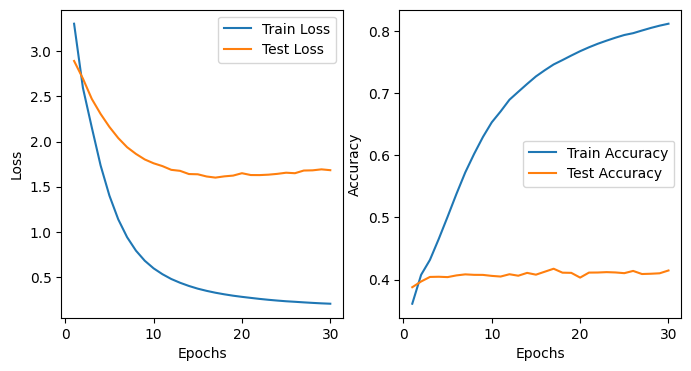

In [ ]:
plot_train_and_test_loss_accuracy()

The initial decrease in test loss and slight increase in test accuracy suggest some level of generalization. However, the plateau indicates that the model's ability to improve further on unseen data is limited. Here as well there is a gap between train and test preformances, indicating some degree of overfitting.

# Evaluating Feature Importance using SHAP Values

SHAP summary plot provides a comprehensive visualization of feature importance and their impact on the model's predictions. In the context of our work, we want to see what words will influence most on the prediction of the rating/recommendation of each user, as they are our features.

In [ ]:
import shap

class WrappedModel:
    def __init__(self, model):
        self.model = model

    def predict(self, data):
        self.model.eval()
        with torch.no_grad():
            user_idx = torch.LongTensor(data[:, 0].astype(np.int64)).to(device)
            book_idx = torch.LongTensor(data[:, 1].astype(np.int64)).to(device)
            bow_features = torch.FloatTensor(data[:, 2:].astype(np.float32)).to(device)
            return self.model(user_idx, book_idx, bow_features).cpu().numpy()

PermutationExplainer explainer: 43805it [14:29, 50.14it/s]


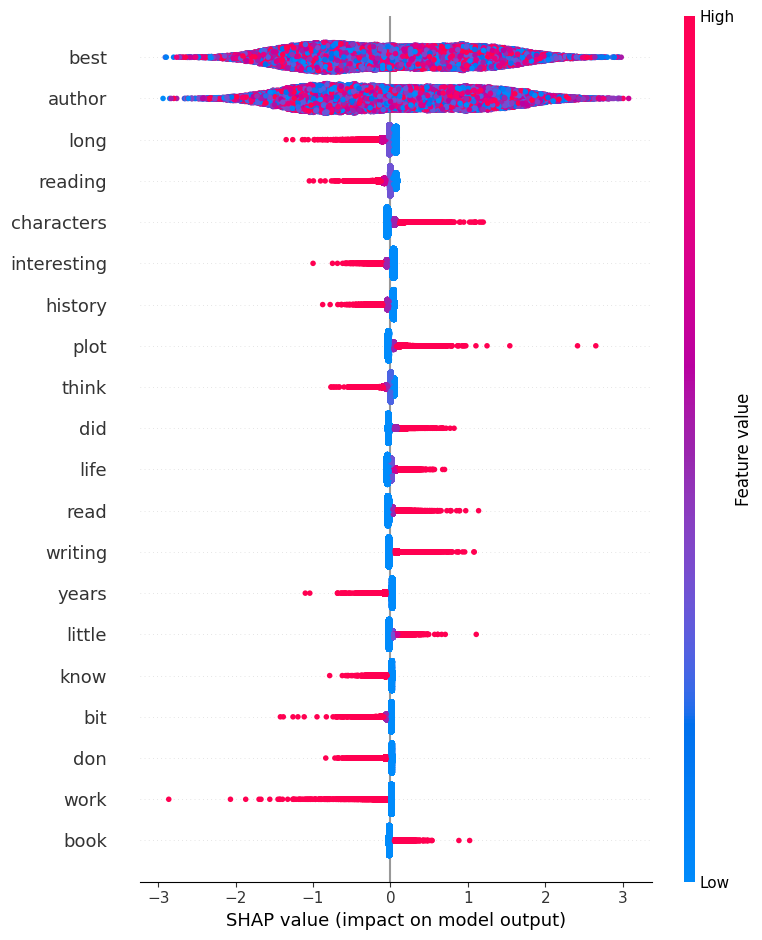

In [ ]:

test_data = np.hstack((
    test_df[['user_idx', 'book_idx']].values,
    bow_features_tensor_test.cpu().numpy()
))

wrapped_model = WrappedModel(model)

explainer = shap.Explainer(wrapped_model.predict, test_data)
shap_values = explainer(test_data)

feature_names = test_df.drop(columns=['overall', 'reviewerID', 'asin', 'user_idx', 'book_idx']).columns.tolist()

shap.summary_plot(shap_values, test_data, feature_names=feature_names)


The visualization above shows how the top textual features impact the model's output for book reviews. From the top features, we observe significant influence from the words "best" and "author," indicating their strong association with the review sentiment.

*"Best" and "Author": These features have a substantial impact on predictions, with high values contributing positively and low values contributing negatively. This suggests that mentions of "best" and "author" are closely tied to either highly positive or highly negative reviews.

*"Long" and "Interesting": These features tend to negatively impact the predictions. This might indicate that reviews mentioning the book's length or its level of interest are often critical.

*"Plot," "Characters," and "Read": These features positively influence the model's output, reflecting that positive mentions of the plot, characters, or the reading experience are associated with favorable reviews.

*"History": This feature shows a negative correlation with predictions, suggesting that historical context or books categorized under history might lead to lower satisfaction.

If we consider the broader context of book reviews, this makes sense. Features like "best" and "author" directly reflect the reader's overall impression, while aspects like "plot" and "characters" are fundamental to a book's appeal. Conversely, comments on the book's length or interest level often highlight dissatisfaction. Understanding these patterns helps us grasp the critical factors influencing reader satisfaction and the model's decision-making process.

## 5. Sentiment Model

Next we want to generate a senitment based on our features "reviewText", and "summary", working with already made models

In [ ]:
sentiment_path = "/content/drive/MyDrive/books_to_kindle_and_books_parquets/books/combined_books_1_with_sentiment.parquet"
result_df = pd.read_parquet(sentiment_path)

In [ ]:
result_df.head()

,overall,reviewerID,asin,style,__index_level_0__,extracted_category,sentiment_category
0,5,A3H9YD6K9TVKDP,0001713353,{'Format:': ' Hardcover'},15,Children's Books,0
1,5,A3QYDL5CDNYN66,0001061240,{'Format:': ' Hardcover'},47,Children's Books,3
2,5,A1BNWEJ7RVPLQ1,0001712799,{'Format:': ' Hardcover'},72,Children's Books,3
3,4,A3CKPNSGA7JOLK,0001712799,{'Format:': ' Hardcover'},98,Children's Books,3
4,5,A2MOBMVHECYVLE,0002006448,{'Format:': ' Hardcover'},106,Travel,3


In [ ]:
class SentimentNoCategoryModel(nn.Module):
    def __init__(self, n_users, n_books, n_sentiments=4, n_factors=5, y_range=(0, 5.5)):
        super(SentimentNoCategoryModel, self).__init__()
        self.user_factors = nn.Embedding(n_users, n_factors)
        self.user_bias = nn.Embedding(n_users, 1)
        self.book_factors = nn.Embedding(n_books, n_factors)
        self.book_bias = nn.Embedding(n_books, 1)
        self.sentiment_factors = nn.Embedding(n_sentiments, n_factors)
        self.y_range = y_range

    def forward(self, user_idx, book_idx, sentiment_idx):
        user_embed = self.user_factors(user_idx)
        book_embed = self.book_factors(book_idx)
        sentiment_embed = self.sentiment_factors(sentiment_idx)

        user_bias = self.user_bias(user_idx)
        book_bias = self.book_bias(book_idx)

        res = (user_embed * book_embed * sentiment_embed).sum(dim=1, keepdim=True)
        res += user_bias + book_bias
        predicted_rating = torch.sigmoid(res)
        return predicted_rating * (self.y_range[1] - self.y_range[0]) + self.y_range[0]

In [ ]:
train_dataset = TensorDataset(
    torch.LongTensor(train_df['user_idx'].values).to(device),
    torch.LongTensor(train_df['book_idx'].values).to(device),
    torch.LongTensor(train_df['sentiment_category'].values).to(device),
    torch.FloatTensor(train_df['overall'].values).to(device)
)
train_loader = DataLoader(train_dataset, batch_size=1024, shuffle=True)


In [ ]:
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, user_idx, book_idx, sentiment_idx, ratings, asins, reviewer_ids):
        self.user_idx = user_idx
        self.book_idx = book_idx
        self.sentiment_idx = sentiment_idx  # Use sentiment indices instead of category or BoW
        self.ratings = ratings
        self.asins = asins
        self.reviewer_ids = reviewer_ids

    def __len__(self):
        return len(self.user_idx)

    def __getitem__(self, idx):
        return (self.user_idx[idx],
                self.book_idx[idx],
                self.sentiment_idx[idx],  # Return sentiment index
                self.ratings[idx],
                self.asins[idx],  # Return asins as strings
                self.reviewer_ids[idx])  # Return reviewer IDs as strings

In [ ]:

sentiment_idx_tensor_test = torch.LongTensor(test_df['sentiment_category'].values).to(device)
ratings_tensor_test = torch.FloatTensor(test_df['overall'].values).to(device)

test_dataset = CustomDataset(
    user_idx_tensor_test,
    book_idx_tensor_test,
    sentiment_idx_tensor_test,  # Use sentiment indices
    ratings_tensor_test,
    test_df['asin'].values,  # Pass asins as strings
    test_df['reviewerID'].values  # Pass reviewer IDs as strings
)

test_loader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

In [ ]:
# Initialize the model
n_users = result_df['reviewerID'].nunique()
n_books = result_df['asin'].nunique()
n_sentiments = 4
model = SentimentNoCategoryModel(n_users, n_books, n_sentiments).to(device)

In [ ]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []

# Training loop
num_epochs = 30
for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0
    correct_train_preds = 0
    total_train_preds = 0

    for user_idx_batch, book_idx_batch, sentiment_idx_batch, ratings_batch in train_loader:
        user_idx_batch, book_idx_batch, sentiment_idx_batch, ratings_batch = user_idx_batch.to(device), book_idx_batch.to(device), sentiment_idx_batch.to(device), ratings_batch.to(device)
        optimizer.zero_grad()
        pred_ratings = model(user_idx_batch, book_idx_batch, sentiment_idx_batch).squeeze()

        loss = criterion(pred_ratings, ratings_batch)
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

        predicted_ratings = torch.round(pred_ratings).long()
        correct_train_preds += torch.sum(predicted_ratings == ratings_batch).item()
        total_train_preds += len(ratings_batch)

    avg_train_loss = total_train_loss / len(train_loader)
    avg_train_accuracy = correct_train_preds / total_train_preds
    train_losses.append(avg_train_loss)
    train_accuracies.append(avg_train_accuracy)

    model.eval()
    total_test_loss = 0
    correct_test_preds = 0
    total_test_preds = 0

    sentiment_predicted_ratings = pd.DataFrame()

    with torch.no_grad():
        for user_idx, book_idx, sentiment_idx, true_ratings, asin, reviewerID in test_loader:
            user_idx = user_idx.long()
            book_idx = book_idx.long()

            pred_ratings = model(user_idx, book_idx, sentiment_idx).squeeze()
            loss = criterion(pred_ratings, true_ratings)
            total_test_loss += loss.item()

            # Calculate accuracy for test
            predicted_ratings = torch.round(pred_ratings).long()  # Round predictions to the nearest whole number

            batch_df = pd.DataFrame({
                'asin': np.array(asin),  # No need to use .cpu() since asin is already a numpy array of strings
                'reviewerID': np.array(reviewerID),  # Same for reviewerID
                'true_ratings': true_ratings.cpu().numpy(),
                'pred_ratings': predicted_ratings.cpu().detach().numpy(),
                'sentiment_idx': sentiment_idx.cpu().numpy()  # Add sentiment index to the DataFrame
            })

            sentiment_predicted_ratings = pd.concat([sentiment_predicted_ratings, batch_df], ignore_index=True)
            correct_test_preds += torch.sum(predicted_ratings == true_ratings).item()
            total_test_preds += len(true_ratings)

    avg_test_loss = total_test_loss / len(test_loader)
    avg_test_accuracy = correct_test_preds / total_test_preds
    test_losses.append(avg_test_loss)
    test_accuracies.append(avg_test_accuracy)

In [ ]:
sentiment_predicted_ratings.to_csv("/content/drive/MyDrive/sentiment_predicted_ratings.csv")

In [ ]:
torch.save(model.state_dict(), '/content/drive/MyDrive/models/cf_with_sentiment_no_category.pth')

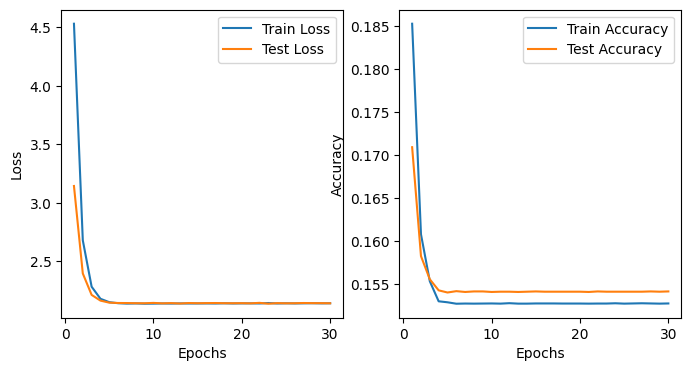

In [ ]:
plot_train_and_test_loss_accuracy()

The loss indeed improves like we have seen before, but unfortunately the accuracy of both the train and the test remains very low compared to previous models.

In [ ]:
# Evaluate the model
user_idx_tensor_test = torch.LongTensor(test_df['user_idx'].values).to(device)
book_idx_tensor_test = torch.LongTensor(test_df['book_idx'].values).to(device)
sentiment_idx_tensor_test = torch.LongTensor(test_df['sentiment_category'].values).to(device)

model.eval()
with torch.no_grad():
    pred_ratings_test = model(user_idx_tensor_test, book_idx_tensor_test, sentiment_idx_tensor_test).squeeze().cpu().numpy()

true_ratings = test_df['overall'].values
true_ratings, pred_ratings_test = true_ratings.reshape(-1), pred_ratings_test.reshape(-1)

ndcg = ndcg_score([true_ratings], [pred_ratings_test])
rmse = np.sqrt(mean_squared_error(true_ratings, pred_ratings_test))
map_score = calculate_map(true_ratings, pred_ratings_test)

print(f"Metrics:\nNDCG: {ndcg:.4f}\nRMSE: {rmse:.4f}\nMAP: {map_score:.4f}")

save_performance_data('cf_with_sentiment_no_category', rmse, ndcg, map_score)

Metrics:
NDCG: 0.9810
RMSE: 1.2649
MAP: 0.2119


# Models Comparing

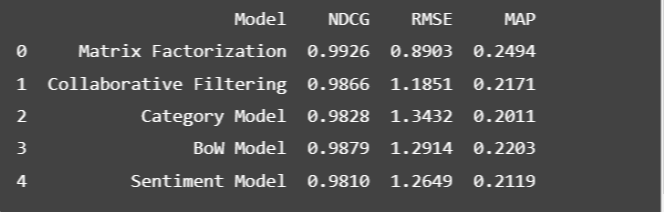

When determining the best model, we need to consider several key performance indicators: Normalized Discounted Cumulative Gain (NDCG), Root Mean Squared Error (RMSE), Mean Average Precision (MAP), Test Loss, and Accuracy.

Matrix Factorization is the best model. This model achieves the highest NDCG of 0.9926, indicating excellent ranking performance. It also has the lowest RMSE of 0.8903, showing that its predictions are closer to the actual values than those of the other models. Additionally, its MAP of 0.2494 suggests that it performs well in terms of precision across recommendations.

The BoW Model can be a second best model. While its NDCG (0.9879) and RMSE (1.2914) are slightly lower than those of Matrix Factorization, it still performs robustly across these metrics. When we look at the test loss and accuracy, the BoW model has a test loss of 1.7 and an accuracy of 0.4.

The Collaborative Filtering model shows an ok performance, but it doesn’t surpass the BoW Model.

On the other hand, the Category Model and Sentiment Model perform the worst.



# Error Analysis

To identify the most significant errors made by each model, as well as the common errors shared across all models, we will generate dataframes containing both the true ratings and the predicted ratings for each user-book pair. This will allow us to analyze and compare the performance of different models on a granular level.
We first read the ratings we have saved for each of our model, then create some pre processing, and then rename the columns in order to make a compraison across each record:

In [ ]:
sentiment_df = pd.read_csv('/content/drive/MyDrive/sentiment_predicted_ratings.csv')
bow_df = pd.read_csv('/content/drive/MyDrive/bow_predicted_ratings.csv')
cf_category_df = pd.read_csv('/content/drive/MyDrive/cf_category_predicted_ratings.csv')
cf_df = pd.read_csv('/content/drive/MyDrive/cf_predicted_ratings.csv')
blant_errors_mf_df = pd.read_csv('/content/drive/MyDrive/blant_errors_mf.csv')

#removing unnamed colomns, colomns that are not relevent for the prediction and true rating from all but the first, making them able to merge
entiment_df = sentiment_df.drop(columns=[col for col in sentiment_df.columns if 'Unnamed' in col or col == 'sentiment_idx'])
bow_df = bow_df.drop(columns=[col for col in bow_df.columns if 'Unnamed' in col or col == 'true_ratings' or col == 'bow_features'])
cf_category_df = cf_category_df.drop(columns=[col for col in cf_category_df.columns if 'Unnamed' in col or col == 'true_ratings' or col == 'category_idx'])
cf_df = cf_df.drop(columns=[col for col in cf_df.columns if 'Unnamed' in col or col == 'true_ratings'])
blant_errors_mf_df = blant_errors_mf_df.drop(columns=[col for col in blant_errors_mf_df.columns if 'Unnamed' in col or col == 'True Rating'])

# Rename the pred_rating column in each dataframe to have unique names
sentiment_df = sentiment_df.rename(columns={"pred_ratings": "sentiment_pred_rating"})
bow_df = bow_df.rename(columns={"pred_ratings": "bow_pred_rating"})
cf_category_df = cf_category_df.rename(columns={"pred_ratings": "cf_category_pred_rating"})
cf_df = cf_df.rename(columns={"pred_ratings": "cf_pred_rating"})
blant_errors_mf_df = blant_errors_mf_df.rename(columns={"pred_ratings": "blant_errors_mf_pred_rating"})

# Merging all dataframes on 'reviewerID' and 'asin'
merged_df = sentiment_df.merge(
    bow_df, on=['reviewerID', 'asin'], how='inner') \
                        .merge(cf_category_df,
                               on=['reviewerID', 'asin'], how='inner') \
                        .merge(cf_df,
                               on=['reviewerID', 'asin'], how='inner')


To pinpoint the most significant errors—those where the prediction gap is 2 or more—we focus on cases where the difference between the true rating and the predicted rating is large enough to represent a major discrepancy in user satisfaction (e.g., between liking and disliking a book).

In [ ]:
filtered_df = merged_df[
    (abs(merged_df['true_ratings'] - merged_df['sentiment_pred_rating']) >= 2) &
    (abs(merged_df['true_ratings'] - merged_df['bow_pred_rating']) >= 2) &
    (abs(merged_df['true_ratings'] - merged_df['cf_category_pred_rating']) >= 2) &
    (abs(merged_df['true_ratings'] - merged_df['cf_pred_rating']) >= 2)
]

In [ ]:
filtered_df

,Unnamed: 0,asin,reviewerID,true_ratings,sentiment_pred_rating,sentiment_idx,bow_pred_rating,cf_category_pred_rating,cf_pred_rating
44,192,0061343811,A3G7BEJJCPD6DS,2.0,5,0,5,5,4
64,244,0060392827,A2INX8B6VXUVW6,5.0,3,3,2,3,3
77,304,0140180346,AOOZD3SGGDXUT,2.0,5,0,4,4,4
88,349,0062318322,A1ZT51CDKQ5CWF,2.0,5,0,4,5,4
118,503,006065337X,A1NIEIENEWXCCQ,2.0,4,3,5,5,5
...,...,...,...,...,...,...,...,...,...
7200,30837,006074815X,AG212WE6M4O5D,3.0,5,1,5,5,5
7363,31529,0316026697,AL5RP8DS1NUV3,1.0,4,0,3,3,3
7374,31589,0131467506,A3JPFWKS83R49V,3.0,5,0,5,5,5
7381,31615,0060590270,A12FPG5P7T0IMA,1.0,3,0,3,4,3


In [ ]:
filtered_df["true_ratings"].value_counts()

,count
true_ratings,
1.0,70
2.0,53
3.0,53
5.0,17


At the beginning of the project, we observed that users tend to give higher ratings more frequently, which could cause models to develop a bias toward predicting higher ratings.
This bias likely contributes to the higher number of blatant errors at the lower end of the rating scale (e.g., 1.0 and 2.0), where the models might incorrectly predict higher ratings.
The models make fewer errors with a true rating of 5.0, which aligns with the tendency of models to predict higher ratings more frequently, potentially due to the skewed distribution of user ratings.

**Identifying Books with the Most Prediction Errors**

To understand which books are contributing most to the prediction errors, especially the blatant errors (where the prediction gap is 2 or more), we can analyze the dataset to find the books with the highest number of such errors.

In [ ]:
filtered_df['asin'].value_counts()[filtered_df['asin'].value_counts() > 1]

,count
asin,
0297859382,2
0060889357,2
0141029455,2


We drill down on one result to see if we can learn anything from it.

In [ ]:
filtered_df[filtered_df['asin']=='0297859382']

,asin,reviewerID,true_ratings,sentiment_pred_rating,sentiment_idx,bow_pred_rating,bow_features,cf_category_pred_rating,category_idx,cf_pred_rating
929,0297859382,AZULU4TOTOLEU,1.0,4,0,5,"[0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,11,5
6628,0297859382,AY8FI73B2HWXB,2.0,4,1,4,"[0.0, 1.0, 0.0, 13.0, 9.0, 0.0, 1.0, 0.0, 1.0,...",5,11,4


In [ ]:
df_filtered[(df_filtered['asin'] == '0297859382') & (df_filtered['reviewerID'] == 'AZULU4TOTOLEU')]


,Unnamed: 0,overall,verified,reviewerID,asin,style,reviewText,summary,__index_level_0__
92542,2588265,1,False,AZULU4TOTOLEU,0297859382,{'Format:': ' Paperback'},"I like the story this book tells, but NOT the ...",Wish this book was gone,2629306


In [ ]:
df_filtered[(df_filtered['asin'] == '0297859382') & (df_filtered['reviewerID'] == 'AY8FI73B2HWXB')]

,Unnamed: 0,overall,verified,reviewerID,asin,style,reviewText,summary,__index_level_0__
94851,2659199,2,True,AY8FI73B2HWXB,0297859382,{'Format:': ' Paperback'},BE ADVISED - SOME SPOILERS. I loved Dark Plac...,Gillian Flynn - WORST BOOK YET,2700821


The analysis of reviews for a book with significant prediction errors reveals that the reviews contain complex and somewhat contradictory sentiments, which likely contribute to the models' difficulties in making accurate predictions.

First Review: The reviewer mentions, "I like the story this book tells," yet the rating given is only 1. This positive statement is at odds with the low rating, making it challenging for the model to predict such a low score.
Second Review: The reviewer states, "I loved Dark Places, and I loved Sharp Objects," but gives the book a rating of 2. Despite expressing love for the author's previous works, the low rating suggests dissatisfaction with this particular book, which the model may struggle to interpret correctly.

These reviews exhibit complex sentiment that doesn't align straightforwardly with the ratings. Positive language in a review with a low rating can mislead the model, which often relies on sentiment analysis or textual features to predict ratings.
Models trained on simpler patterns where positive sentiments correlate with higher ratings might misinterpret these nuanced reviews, leading to larger prediction errors.

The presence of complicated and contradictory sentiments in reviews, such as positive comments paired with low ratings, presents a significant challenge for prediction models. Understanding this complexity can guide improvements in the models, such as incorporating more sophisticated sentiment analysis techniques or additional context, to better handle nuanced or mixed reviews. This insight underscores the importance of considering the full context of a review, rather than relying solely on sentiment, to make more accurate predictions.

**Analyzing User Reviews with the Most Significant Prediction Errors**

Now, we will analyze the user's reviews that caused the most significant prediction errors in our models.

In [ ]:
filtered_df['reviewerID'].value_counts()[filtered_df['reviewerID'].value_counts() > 1]

,count
reviewerID,
A3H9YD6K9TVKDP,3
A3G7BEJJCPD6DS,2
AG212WE6M4O5D,2
A2983OP6MDZ1M1,2
A1BNWEJ7RVPLQ1,2
A5TZXWU8AALIC,2
A3SHHE8ZUDCMR1,2
A1CO8STECR9G9F,2
A1BKMYEQ6BP5B5,2


We again drill down to see if we can learn anything.

In [ ]:
filtered_df[filtered_df['reviewerID']=='A3H9YD6K9TVKDP']

,asin,reviewerID,true_ratings,sentiment_pred_rating,sentiment_idx,bow_pred_rating,bow_features,cf_category_pred_rating,category_idx,cf_pred_rating
441,0307269183,A3H9YD6K9TVKDP,1.0,4,0,3,"[1.0, 0.0, 0.0, 4.0, 0.0, 0.0, 0.0, 2.0, 1.0, ...",5,6,5
5408,0140502882,A3H9YD6K9TVKDP,5.0,2,3,3,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,0,1
6083,0007173989,A3H9YD6K9TVKDP,1.0,5,0,3,"[1.0, 1.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5,9,5


In [ ]:
df_filtered[(df_filtered['asin'] == '0307269183') & (df_filtered['reviewerID'] == 'A3H9YD6K9TVKDP')]

,Unnamed: 0,overall,verified,reviewerID,asin,style,reviewText,summary,__index_level_0__
93627,2632722,1,True,A3H9YD6K9TVKDP,0307269183,{'Format:': ' Paperback'},The front interior blurb encompasses part of t...,Not Convincing from the Outset,2674165


As we can see from the previous review, the user reviewText is a bit complicated, making both humans and AI models not sure what they tried to say. The next review, shows that the user even wrote a book summary rather than opinion on the book itself:

In [ ]:
df_filtered[(df_filtered['asin'] == '0140502882') & (df_filtered['reviewerID'] == 'A3H9YD6K9TVKDP')]

,Unnamed: 0,overall,verified,reviewerID,asin,style,reviewText,summary,__index_level_0__
63648,1834874,5,False,A3H9YD6K9TVKDP,0140502882,{'Format:': ' Paperback'},Norman secretly works and lives at the art mus...,A Mouse Who Love Art,1865299


Because the available data consists of ratings, review texts, and summaries, we must rely solely on these. Consequently, when attempting to characterize mistakes, we find that users' review texts and summaries might be more complected than a straight-forward review. The text can also be lengthy and present an ambivalent opinion, leading to contradictions if a study examines only the first 510 tokens or attempts to compare the review to the rating.

# Future work and improvement ideas


1.   Despite instructing the BOW model to ignore stop words, it still learned some of them. A more effective approach could involve creating a custom stop words filter to ensure these words are properly excluded.
2.   We can try larger number of features in the BOW model. Experimenting with different feature counts could help improve model performance and reduce overfitting.
3. We can involve creating clusters based on individual users, which might lead to more personalized and effective recommendations across models.

4. Develop a recommendation system focused on specific genres, like fiction, rather than attempting to cover all genres, which could result in more accurate and relevant suggestions.

5. Dividing users according to their preferred genres, such as recommending only travel books to users who primarily read travel literature, could enhance the relevance of the recommendations provided.

6. As we saw through the project, we have many more 4 and 5 star rating values in the "overall" column, and way less 1 and 2 values. In order to gain a higher accuracy, we can modify the dataset, making it more balanced, either by generating synthetic data, or sampling only few of the 4,5-star ratings.

7. We saw that we have a bit of overfiting in our networks, and adding L2 regularization didn't solve the problem. This might indicate that our networks didn't learn the complexity of the data, and other regularization techniques would improve the network, as well as creating more complexed networks, with deeper architecture.



# Concluding Remarks

Working with a large dataset presented significant challenges throughout the project. We encountered several learning moments that, in hindsight, could have streamlined our process for future endeavors. For example, we discovered the importance of working with batches of data rather than processing everything at once. Conducting the EDA without fully understanding the meaning of each column led to repeated analysis, which was time-consuming. We also learned that using Colab for an extended project can be challenging due to session timeouts and RAM limitations, despite subscribing to Colab Pro. After comparing it with Kaggle, we found that Colab offered more resources for our needs, but we still frequently hit performance limitations, especially when initially trying to process a vast number of reviews. Eventually, we restricted our analysis to users with only 50-100 reviews to avoid crashes.

In retrospect, creating our own dataset through web scraping might have been a better approach than using an existing one, but this experience provided valuable real-world preparation. We ended the project somewhat frustrated because the clustering and dimension reduction methods did not yield satisfactory results. Additionally, we now believe that using deeper neural networks might have improved our performance.

Ultimately, working on recommendation systems has been a fascinating experience, revealing just how much there is to learn and explore. We feel that we've only scratched the surface. Due to computational constraints, we focused on developing an item-based recommendation system rather than a user-based one. It would have been exciting to explore user-based recommendations if we had more computational power.